[Encoder] Layer 0: in=3, out=32, size=256x256
[Encoder] Layer 1: in=32, out=64, size=128x128
[Encoder] Layer 2: in=64, out=128, size=64x64
[Encoder] Conv output: 128x64x64
[Encoder] Latent output: 4x64x64
[Decoder] Latent input: 4x64x64
[Decoder] Decoder start: 128x64x64
[Decoder] Layer 0: in=128, out=128, size=128x128
[Decoder] Layer 1: in=128, out=64, size=256x256
[Decoder] Layer 2: in=64, out=32, size=512x512
[Decoder] Final output: 3x512x512


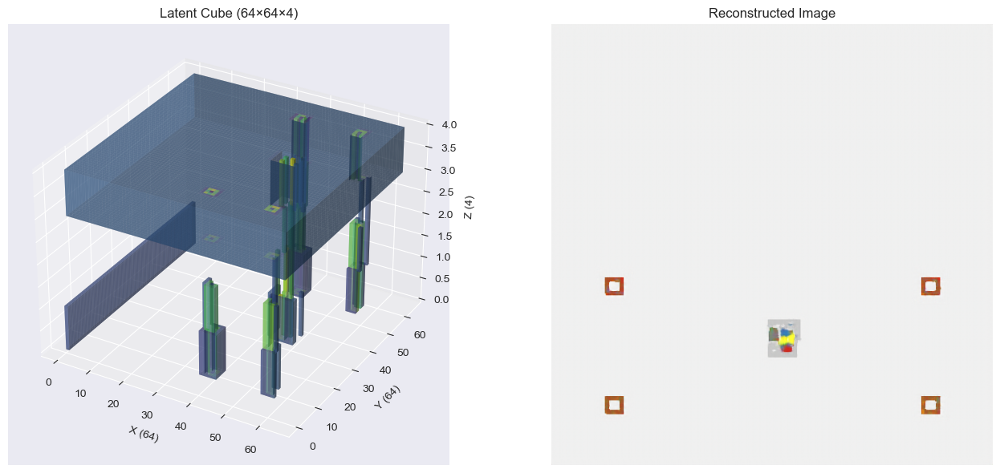

In [3]:
import sys
sys.path.append(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav")

import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib import cm
from modules.autoencoder import AutoEncoder

# Load model
model = AutoEncoder.from_config(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav\indexes\ae_configs\config_diff_4ch_64x64_vanilla.yml")
model.load_state_dict(torch.load(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav\indexes\autoencoder_final_64x64x4_vanila\20251004-082051_ae_final\best.pt", map_location='cpu'))
model.eval()

# Load embeddings (4, 64, 64) -> treat as (64, 64, 4) cube
embeddings = torch.load(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav\indexes\0a25c251-7c80-4808-b609-3d6fbae9efad_layout_emb.pt", map_location='cpu')
embeddings = torch.load(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav\indexes\0a17c68b-b74d-4d81-afe4-bc2ed405f0ec_layout_emb.pt")
# Decode
with torch.no_grad():
    img = model.decoder(embeddings.unsqueeze(0)).squeeze(0)

# Plot side by side
fig = plt.figure(figsize=(14, 6))

# 3D voxel cube (64x64x4)
ax1 = fig.add_subplot(121, projection='3d')
voxel_data = embeddings.permute(1, 2, 0).numpy()  # (64, 64, 4)

# Threshold for visualization
threshold = np.abs(voxel_data).mean() + np.abs(voxel_data).std()
voxels = np.abs(voxel_data) > threshold

# Color based on value magnitude with viridis colormap
norm = plt.Normalize(vmin=voxel_data.min(), vmax=voxel_data.max())
colors = cm.viridis(norm(voxel_data))
colors[..., 3] = 0.5  # Set alpha

ax1.voxels(voxels, facecolors=colors, edgecolor='none')
ax1.set_title('Latent Cube (64×64×4)')
ax1.set_xlabel('X (64)')
ax1.set_ylabel('Y (64)')
ax1.set_zlabel('Z (4)')

# Reconstructed image
ax2 = fig.add_subplot(122)
ax2.imshow(img.permute(1, 2, 0).clamp(0, 1))
ax2.set_title('Reconstructed Image')
ax2.axis('off')

plt.tight_layout()
plt.show()

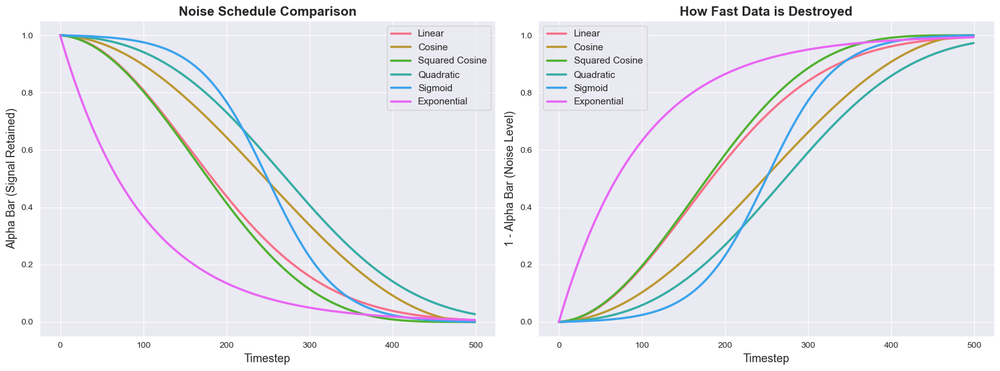

In [2]:
import sys
sys.path.append(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav")

import torch
import matplotlib.pyplot as plt
import seaborn as sns
from modules.scheduler import LinearScheduler, CosineScheduler, SquaredCosineScheduler , SigmoidScheduler , ExponentialScheduler, QuadraticScheduler



# Setup seaborn style
sns.set_style("darkgrid")
sns.set_palette("husl")

# Setup schedulers
num_steps = 500
schedulers = {
    'Linear': LinearScheduler(num_steps),
    'Cosine': CosineScheduler(num_steps),
    'Squared Cosine': SquaredCosineScheduler(num_steps),
    'Quadratic': QuadraticScheduler(num_steps),
    'Sigmoid': SigmoidScheduler(num_steps),
    'Exponential': ExponentialScheduler(num_steps),
}

# Plot the schedules
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

steps = torch.arange(num_steps)

for name, scheduler in schedulers.items():
    sns.lineplot(x=steps, y=scheduler.alpha_bars, label=name, linewidth=2.5, ax=ax1)
    sns.lineplot(x=steps, y=1 - scheduler.alpha_bars, label=name, linewidth=2.5, ax=ax2)

ax1.set_xlabel('Timestep', fontsize=13)
ax1.set_ylabel('Alpha Bar (Signal Retained)', fontsize=13)
ax1.set_title('Noise Schedule Comparison', fontsize=15, fontweight='bold')
ax1.legend(fontsize=11)

ax2.set_xlabel('Timestep', fontsize=13)
ax2.set_ylabel('1 - Alpha Bar (Noise Level)', fontsize=13)
ax2.set_title('How Fast Data is Destroyed', fontsize=15, fontweight='bold')
ax2.legend(fontsize=11)

plt.tight_layout()
plt.show()

[Encoder] Layer 0: in=3, out=32, size=256x256
[Encoder] Layer 1: in=32, out=64, size=128x128
[Encoder] Layer 2: in=64, out=128, size=64x64
[Encoder] Conv output: 128x64x64
[Encoder] Latent output: 4x64x64
[Decoder] Latent input: 4x64x64
[Decoder] Decoder start: 128x64x64
[Decoder] Layer 0: in=128, out=128, size=128x128
[Decoder] Layer 1: in=128, out=64, size=256x256
[Decoder] Layer 2: in=64, out=32, size=512x512
[Decoder] Final output: 3x512x512
Saved: scheduler_plots\linear_1000.png


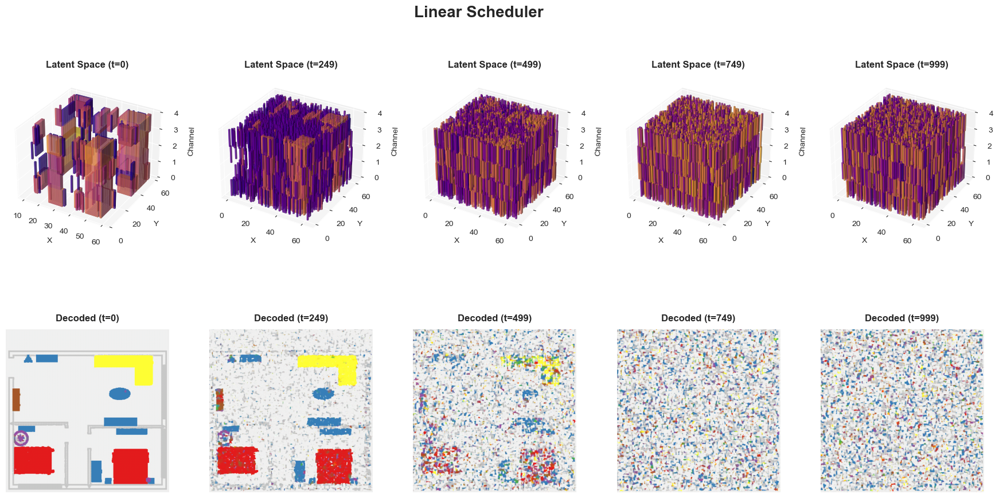

Saved: scheduler_plots\cosine_1000.png


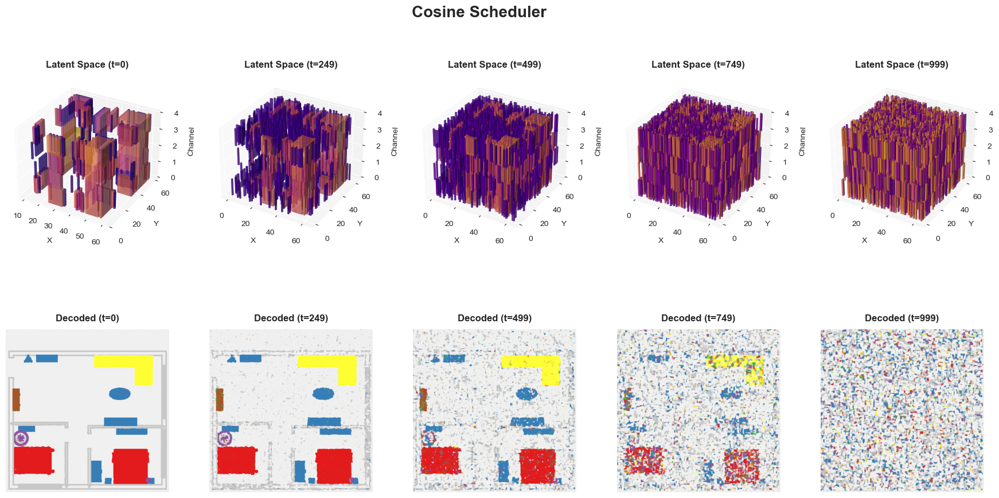

Saved: scheduler_plots\squared_cosine_1000.png


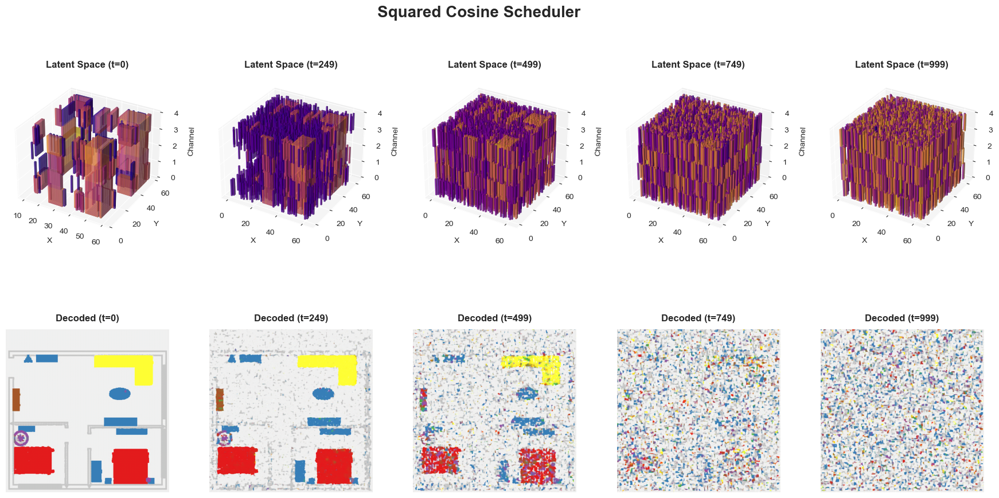

Saved: scheduler_plots\quadratic_1000.png


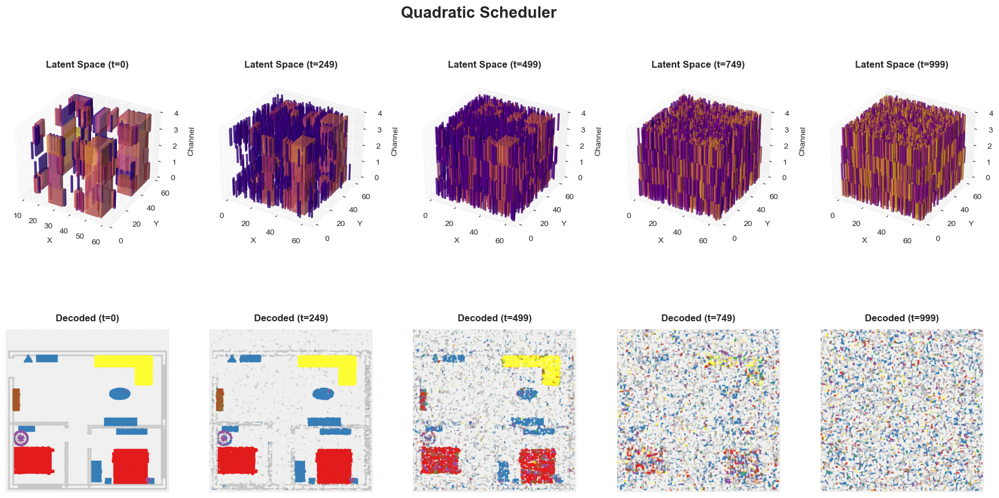

Saved: scheduler_plots\sigmoid_1000.png


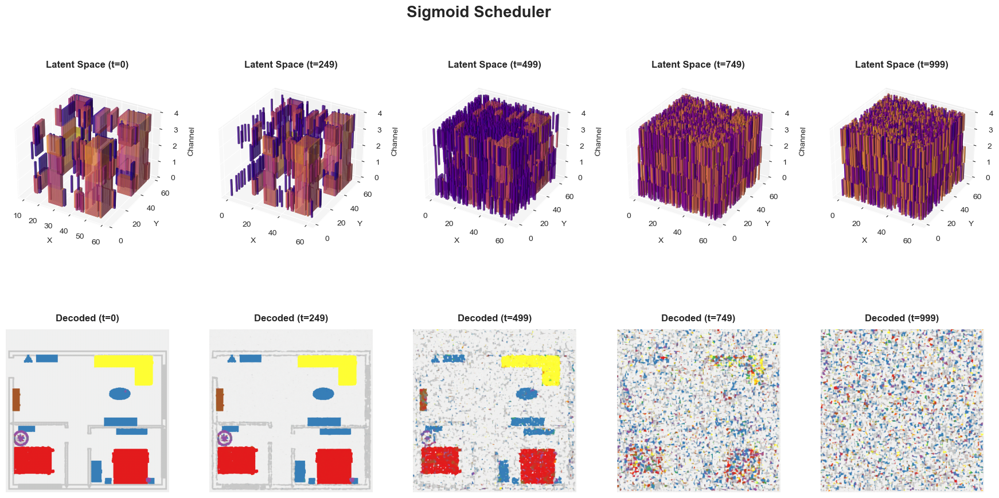

Saved: scheduler_plots\exponential_1000.png


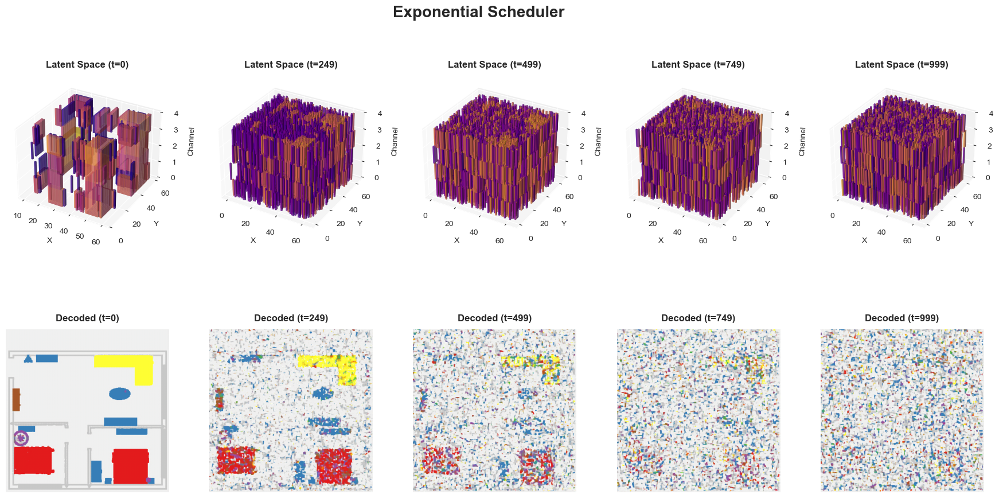


All plots saved to 'scheduler_plots' directory


In [3]:
import sys
sys.path.append(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav")

import torch
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib import cm
import seaborn as sns
import os
from modules.autoencoder import AutoEncoder
from modules.scheduler import (
    LinearScheduler, 
    CosineScheduler,
    SquaredCosineScheduler,
    SigmoidScheduler,
    ExponentialScheduler,
    QuadraticScheduler
)

# Set style
sns.set_style("darkgrid")
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.size'] = 10

# Create output directory for plots
output_dir = "scheduler_plots"
os.makedirs(output_dir, exist_ok=True)

# Load model
model = AutoEncoder.from_config(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav\indexes\ae_configs\config_diff_4ch_64x64_vanilla.yml")
model.load_state_dict(torch.load(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav\indexes\autoencoder_final_64x64x4_vanila\20251004-082051_ae_final\best.pt", map_location='cpu'))
model.eval()

# Load embeddings
embeddings = torch.load(r"C:\Users\Hagai.LAPTOP-QAG9263N\Desktop\Thesis\repositories\ImagiNav\indexes\0a25c251-7c80-4808-b609-3d6fbae9efad_layout_emb.pt", map_location='cpu')

# Setup schedulers
num_steps = 1000
schedulers = {
    'Linear': LinearScheduler(num_steps),
    'Cosine': CosineScheduler(num_steps),
    'Squared Cosine': SquaredCosineScheduler(num_steps),
    'Quadratic': QuadraticScheduler(num_steps),
    'Sigmoid': SigmoidScheduler(num_steps),
    'Exponential': ExponentialScheduler(num_steps),
}

torch.manual_seed(1)
# Test at different timesteps
num_samples = 5  # number of plotted points
timesteps = np.linspace(0, num_steps - 1, num_samples, dtype=int)

# Create figure for each scheduler
for sched_name, scheduler in schedulers.items():
    fig = plt.figure(figsize=(22, 10))
    fig.patch.set_facecolor('white')
    fig.suptitle(f'{sched_name} Scheduler', fontsize=20, fontweight='bold', y=0.98)
    
    for i, t in enumerate(timesteps):
        noise = torch.randn_like(embeddings)
        noisy_emb, _ = scheduler.add_noise(embeddings, torch.tensor([t]), noise)
        
        # Top row: 3D voxel latent
        ax_lat = fig.add_subplot(2, len(timesteps), i + 1, projection='3d')
        ax_lat.set_facecolor('white')
        voxel_data = noisy_emb.permute(1, 2, 0).numpy()
        
        threshold = np.abs(voxel_data).mean() + 0.5 * np.abs(voxel_data).std()
        voxels = np.abs(voxel_data) > threshold
        
        norm = plt.Normalize(vmin=voxel_data.min(), vmax=voxel_data.max())
        colors = cm.plasma(norm(voxel_data))
        colors[..., 3] = 0.6
        
        ax_lat.voxels(voxels, facecolors=colors, edgecolor='none')
        ax_lat.set_title(f'Latent Space (t={t})', fontsize=12, fontweight='bold', pad=10)
        ax_lat.set_xlabel('X', fontsize=10)
        ax_lat.set_ylabel('Y', fontsize=10)
        ax_lat.set_zlabel('Channel', fontsize=10)
        ax_lat.grid(True, alpha=0.3)
        
        # Bottom row: Reconstruction
        ax_rec = fig.add_subplot(2, len(timesteps), len(timesteps) + i + 1)
        with torch.no_grad():
            img = model.decoder(noisy_emb.unsqueeze(0)).squeeze(0)
        
        ax_rec.imshow(img.permute(1, 2, 0).clamp(0, 1))
        ax_rec.set_title(f'Decoded (t={t})', fontsize=12, fontweight='bold', pad=10)
        ax_rec.axis('off')
        # Add border
        for spine in ax_rec.spines.values():
            spine.set_edgecolor('#CCCCCC')
            spine.set_linewidth(2)
    
    plt.subplots_adjust(hspace=0.35, wspace=0.25)
    
    # Save the figure for each scheduler
    # Create a clean filename by replacing spaces with underscores
    scheduler_filename = sched_name.replace(' ', '_').lower()
    save_path = os.path.join(output_dir, f"{scheduler_filename}_{num_steps}.png")
    plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
    print(f"Saved: {save_path}")
    
    plt.show()
    plt.close(fig)

print(f"\nAll plots saved to '{output_dir}' directory")